In [17]:
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

import jax
import jax.numpy as jnp
from jax.scipy.stats import norm as jnorm
jax.config.update("jax_enable_x64", True)

# Setup / Cleaning

In [18]:
months = [10,11,12]
full_df = pd.DataFrame()
for month in months:
    file = f"data/spy_eod_2023{month:02d}.txt"
    df = pd.read_csv(file, sep=", ", engine="python")
    df.columns = [header[1:-1] for header in df.columns]
    full_df = pd.concat([full_df, df], ignore_index=True)

print(full_df.columns)
print(full_df.shape)

Index(['QUOTE_UNIXTIME', 'QUOTE_READTIME', 'QUOTE_DATE', 'QUOTE_TIME_HOURS',
       'UNDERLYING_LAST', 'EXPIRE_DATE', 'EXPIRE_UNIX', 'DTE', 'C_DELTA',
       'C_GAMMA', 'C_VEGA', 'C_THETA', 'C_RHO', 'C_IV', 'C_VOLUME', 'C_LAST',
       'C_SIZE', 'C_BID', 'C_ASK', 'STRIKE', 'P_BID', 'P_ASK', 'P_SIZE',
       'P_LAST', 'P_DELTA', 'P_GAMMA', 'P_VEGA', 'P_THETA', 'P_RHO', 'P_IV',
       'P_VOLUME', 'STRIKE_DISTANCE', 'STRIKE_DISTANCE_PCT'],
      dtype='object')
(249164, 33)


In [19]:
full_df["pd_QUOTE_DATE"] = pd.to_datetime(full_df["QUOTE_DATE"])
full_df["pd_EXPIRE_DATE"] = pd.to_datetime(full_df["EXPIRE_DATE"])

full_df["Time to Maturity"] = (full_df["pd_EXPIRE_DATE"] - full_df["pd_QUOTE_DATE"]).dt.days
full_df["Time to Maturity"] = full_df["Time to Maturity"] / 365

# Throw out short and long maturities
full_df = full_df[full_df["Time to Maturity"] >= 0.05]
full_df = full_df[full_df["Time to Maturity"] <= 1]

# Throw out deep ITM/OTM
full_df = full_df[full_df["UNDERLYING_LAST"]/full_df["STRIKE"] <= 1.3]
full_df = full_df[full_df["UNDERLYING_LAST"]/full_df["STRIKE"] >= 0.7]

# Use midpoint prices
full_df["Call Price"] = (full_df["C_BID"] + full_df["C_ASK"]) / 2

daily_df = {}
for date, group in full_df.groupby("QUOTE_DATE"):
    daily_df[date] = group[["UNDERLYING_LAST","STRIKE","Time to Maturity","Call Price"]].reset_index(drop=True)
    daily_df[date].columns = ["S","K","T","C"]

days = list(daily_df.keys())
pd_days = [pd.to_datetime(d).normalize() for d in days]

print(f"Options used: {full_df.shape[0]:,}")
print(f"Trading days: {len(days)}")
print(daily_df['2023-10-02'].iloc[:10].to_string(index=False))

Options used: 99,410
Trading days: 63
     S     K        T      C
427.36 330.0 0.068493 98.635
427.36 335.0 0.068493 93.700
427.36 340.0 0.068493 88.720
427.36 345.0 0.068493 83.535
427.36 350.0 0.068493 78.815
427.36 355.0 0.068493 73.835
427.36 360.0 0.068493 68.745
427.36 365.0 0.068493 63.920
427.36 370.0 0.068493 58.975
427.36 375.0 0.068493 54.030


In [32]:
sofr = pd.read_csv("data/SOFR_2023.csv")[["Effective Date","Rate (%)"]]
sofr.columns = ["Date", "SOFR"]
sofr["Date"] = pd.to_datetime(sofr["Date"])
sofr["SOFR"] = sofr["SOFR"]/100

# convert simple to continuous
sofr["SOFR"] = np.log(1 + sofr["SOFR"])

sofr.set_index("Date", inplace=True)

sofr = sofr.dropna()
sofr.sort_index(inplace=True)

def get_sofr(date):
    lookup_date = sofr.index.asof(date) # in case date is unavailable
    return sofr.loc[lookup_date]['SOFR']

# Data Visualization

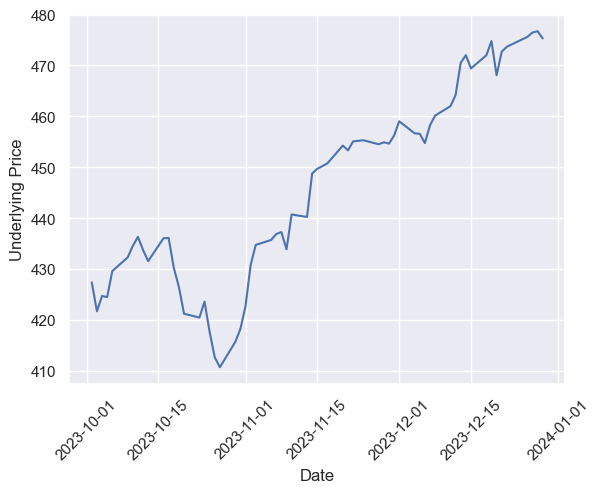

In [33]:
plt.plot(full_df["pd_QUOTE_DATE"], full_df["UNDERLYING_LAST"])

plt.xticks(rotation=45)
plt.xlabel("Date")
plt.ylabel("Underlying Price")

plt.show()

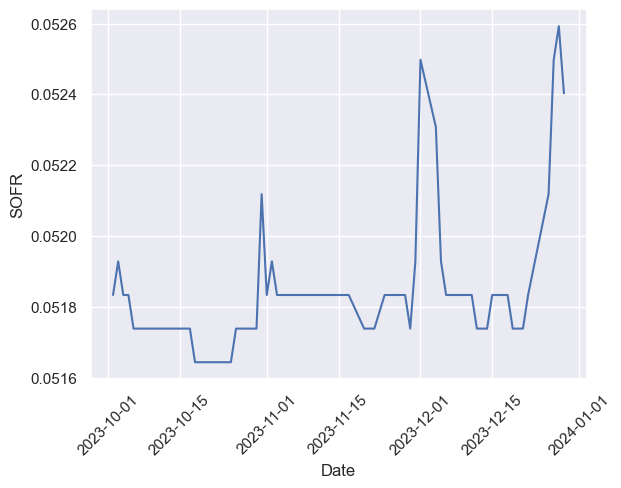

In [34]:
rates = [get_sofr(day) for day in pd_days]

plt.plot(pd_days, rates)

plt.xticks(rotation=45)
plt.xlabel("Date")
plt.ylabel("SOFR")

plt.show()

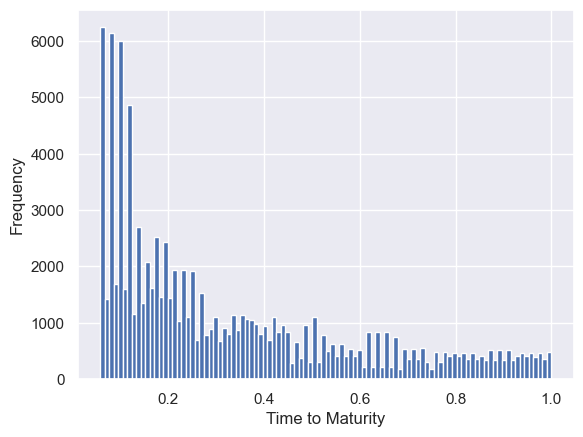

In [35]:
plt.hist(full_df["Time to Maturity"],bins=100)

plt.xlabel("Time to Maturity")
plt.ylabel("Frequency")

plt.show()

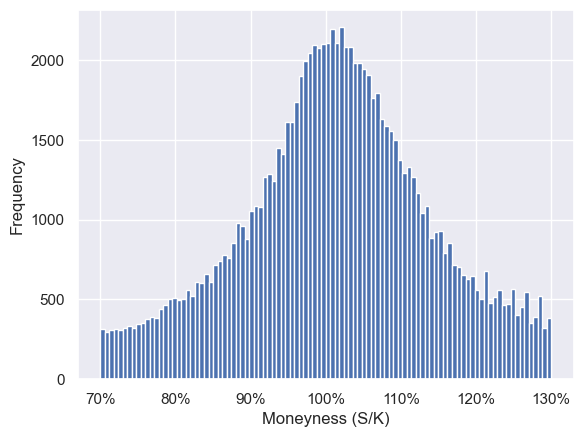

In [36]:
import matplotlib.ticker as mtick

fig, ax = plt.subplots()
ax.hist(full_df["UNDERLYING_LAST"]/full_df["STRIKE"],bins=100)

ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1))


plt.xlabel("Moneyness (S/K)")
plt.ylabel("Frequency")

plt.show()

# Calibration

### BBSR Code

In [37]:
def fast_black_scholes_call(S_0,K,T,sigma,r,q):
    srt = sigma*jnp.sqrt(T)
    d1 = (jnp.log(S_0/K)+(r-q+sigma**2/2)*T)/srt
    d2 = d1 - srt

    return S_0*jnp.exp(-q*T)*jnorm.cdf(d1) - K*jnp.exp(-r*T)*jnorm.cdf(d2)

def bbs_am_core(params,N):
    S_0,K,T,sigma,r,q = params

    delta = T/N
    u = jnp.exp(sigma*jnp.sqrt(delta))
    d = 1/u
    pstar = (jnp.exp((r-q)*delta)-d)/(u-d)
    disc = jnp.exp(-r*delta)

    # initialize S at step N-1
    i = jnp.arange(N)
    S = S_0 * u**(2*i - N + 1)

    # initialize V at step N-1 using black scholes
    continuing_val = fast_black_scholes_call(S, K, delta, sigma, r, q)
    V = jnp.maximum(continuing_val, S - K)

    def step(carry, _):
        V, S = carry

        S_new = S[:-1]*u
        continuing_val = (pstar * V[1:] + (1-pstar) * V[:-1]) * disc
        exercise_val = jnp.maximum(S_new-K,0)
        V_new = jnp.maximum(continuing_val,exercise_val)

        V = jnp.concatenate([V_new, jnp.zeros(1)], axis=0)
        S = jnp.concatenate([S_new, jnp.zeros(1)], axis=0)
        return (V, S), None

    (V_final,_),_ = jax.lax.scan(step, (V,S), length=N-1)
    return V_final[0]

def bbs_eur_core(params,N):
    S_0,K,T,sigma,r,q = params

    delta = T/N
    u = jnp.exp(sigma*jnp.sqrt(delta))
    d = 1/u
    pstar = (jnp.exp((r-q)*delta)-d)/(u-d)
    disc = jnp.exp(-r*delta)

    # initialize S at step N-1
    i = jnp.arange(N)
    S = S_0 * u**(2*i - N + 1)

    # initialize V at step N-1 using black scholes
    V = fast_black_scholes_call(S,K,delta,sigma,r,q)

    def step(carry, _):
        V, S = carry

        S_new = S[:-1]*u
        V_new = (pstar * V[1:] + (1-pstar) * V[:-1]) * disc

        V = jnp.concatenate([V_new, jnp.zeros(1)], axis=0)
        S = jnp.concatenate([S_new, jnp.zeros(1)], axis=0)
        return (V, S), None

    (V_final,_),_ = jax.lax.scan(step, (V,S), length=N-1)
    return V_final[0]

def bbsr_am_core(params,N):
    C1 = bbs_am_core(params,N//2)
    C2 = bbs_am_core(params,N)
    return(2*C2 - C1)

def bbsr_eur_core(params,N):
    C1 = bbs_eur_core(params,N//2)
    C2 = bbs_eur_core(params,N)
    return(2*C2 - C1)

bbsr_am_jit = jax.jit(bbsr_am_core,static_argnames='N')
bbsr_eur_jit = jax.jit(bbsr_eur_core,static_argnames='N')

bbsr_am_vmap = jax.jit(jax.vmap(bbsr_am_core,in_axes=(0,None)), static_argnames='N')
bbsr_eur_vmap = jax.jit(jax.vmap(bbsr_eur_core,in_axes=(0,None)), static_argnames='N')

def bbsr(params,option_type,exercise_type,N):
    if N%2!=0:
        raise ValueError("N must be even for BBSR")

    if option_type=='C':
        pass
    elif option_type=='P':
        S,K,T,sigma,r,q = params
        params = (K,S,T,sigma,q,r)
    else:
        raise ValueError("Invalid option type")

    if exercise_type=='A':
        price = bbsr_am_jit(params,N)
    elif exercise_type=='E':
        price = bbsr_eur_jit(params,N)
    else:
        raise ValueError("Invalid exercise type")
    return(price)

def bbsr_vector(param_array,option_type,exercise_type,N):
    if N%2!=0:
        raise ValueError("N must be even for BBSR")

    if option_type=='C':
        pass
    elif option_type=='P':
        param_array = param_array[:,[1,0,2,3,5,4]]
    else:
        raise ValueError("Invalid option type")

    if exercise_type=='A':
        price = bbsr_am_vmap(param_array,N)
    elif exercise_type=='E':
        price = bbsr_eur_vmap(param_array,N)
    else:
        raise ValueError("Invalid exercise type")
    return(price)

### Calibration

In [38]:
from scipy.optimize import brentq

def calibrate_american_call(S_0, K, T, r, q, observed_price, bracket):
    price_error = lambda sigma: bbsr((S_0, K, T, sigma, r, q),'C','A', 200) - observed_price
    try:
        return brentq(price_error,bracket[0],bracket[1],xtol=1e-4)
    except ValueError:
        return np.nan

In [40]:
S_0, K, T, price  = daily_df['2023-10-02'].iloc[0]
r = get_sofr('2023-10-02')
q = 0.012

calibrate_american_call(S_0,K,T,r,q,price,(0.10,0.60))

0.5067963662136935

In [43]:
day = '2023-10-02'
n = daily_df[day].shape[0]

#  quick check if bracket is wide enough to minimize nans (some are unavoidable)
bracket = (0.10,0.60)
fails = 0
for i in range(n):
    S_0, K, T, price  = daily_df[day].iloc[i]
    r = get_sofr(day)
    q = 0.012
    sigma = calibrate_american_call(S_0, K, T, r, q, price, bracket)
    if sigma is np.nan:
        fails += 1
print(f"Failure Count: {fails}")

Failure Count: 0


# Implied Volatility Surface

In [29]:
from scipy.interpolate import RBFInterpolator

def make_iv_surface_RBF(day,q=0.012,bracket=(0.01,1.00)):
    r = get_sofr(day)
    ivs, moneyness,maturity = [], [], []
    for i in range(daily_df[day].shape[0]):
        S, K, T, price  = daily_df[day].iloc[i]
        sigma = calibrate_american_call(S, K, T, r, q, price, bracket)
        if np.isnan(sigma):
            continue
        ivs.append(sigma)
        moneyness.append(S/K)
        maturity.append(T)
        
    # train interpolator on actual points
    points = np.column_stack((moneyness, maturity))
    rbf = RBFInterpolator(points, ivs, kernel='thin_plate_spline')

    # create a regular grid for plotting
    moneyness_grid = np.linspace(min(moneyness), max(moneyness), 50)
    maturity_grid = np.linspace(min(maturity), max(maturity), 50)
    M, T = np.meshgrid(moneyness_grid, maturity_grid)
    grid_points = np.c_[M.ravel(), T.ravel()]
    
    # and interpolate onto the grid
    iv_surface = rbf(grid_points).reshape(M.shape)

    return M, T, iv_surface

def draw_iv_surface(M, T, iv_surface, day):
    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111, projection='3d')

    surf = ax.plot_surface(M, T, iv_surface, cmap='viridis', edgecolor='none')

    ax.view_init(elev=30, azim=135) 
    ax.set_xlabel('Moneyness (S/K)')
    ax.set_ylabel('Maturity (years)')
    ax.set_zlabel('Implied Volatility')
    ax.set_title(f'Market Implied Volatility Surface on {day}')

    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=8,pad=0.1)
    plt.tight_layout()
    plt.show()

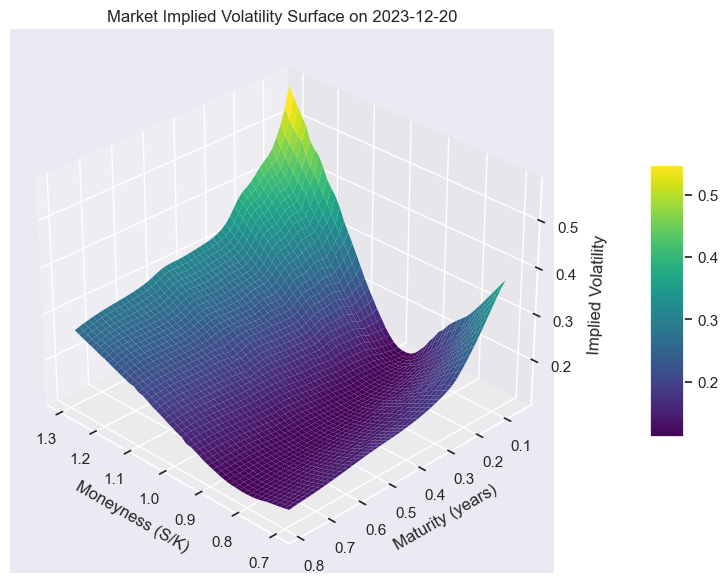

In [48]:
day = '2023-12-20'
M, T, iv = make_iv_surface_RBF(day, bracket=(0.10,0.60))
draw_iv_surface(M, T, iv, day)

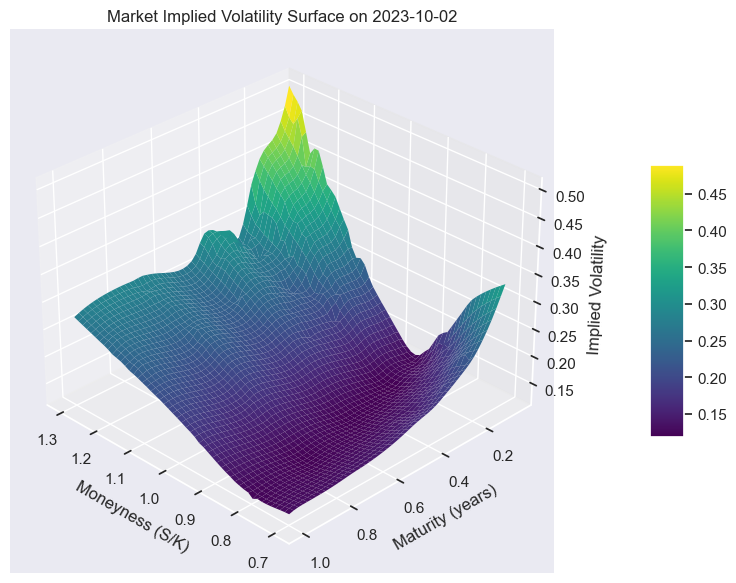

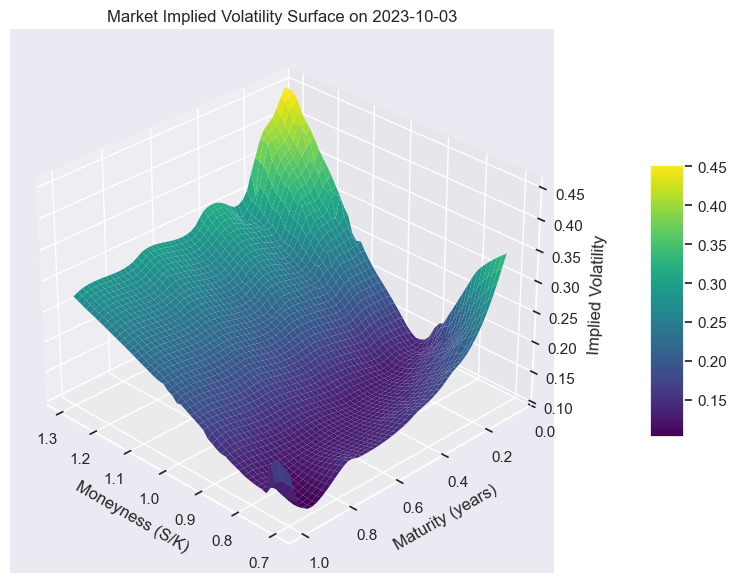

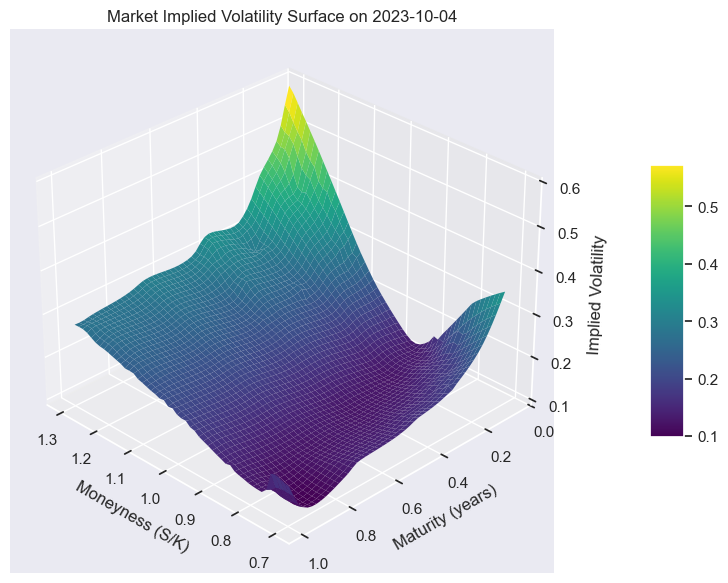

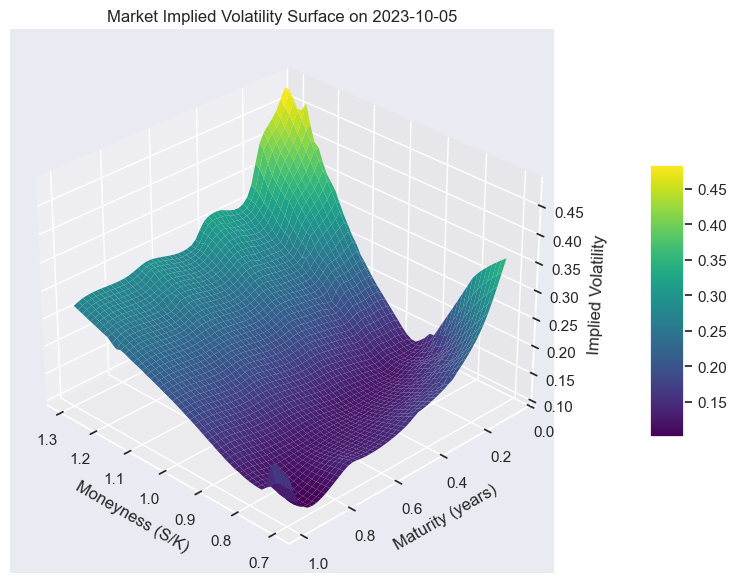

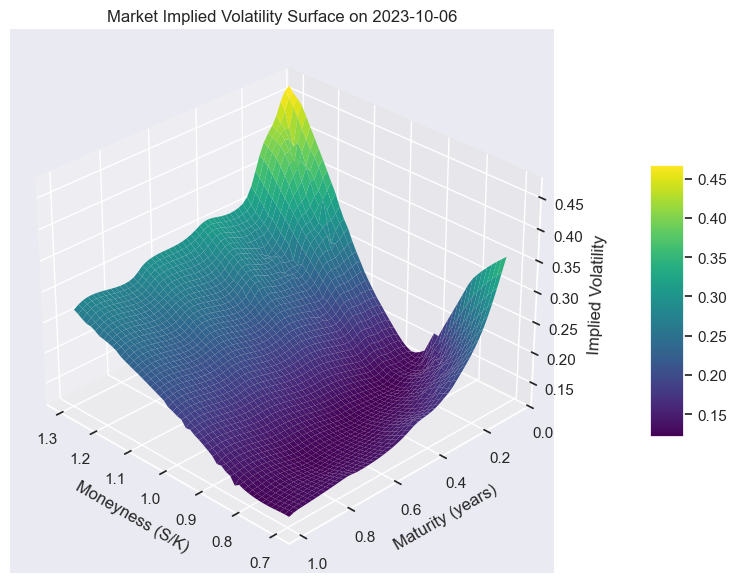

...

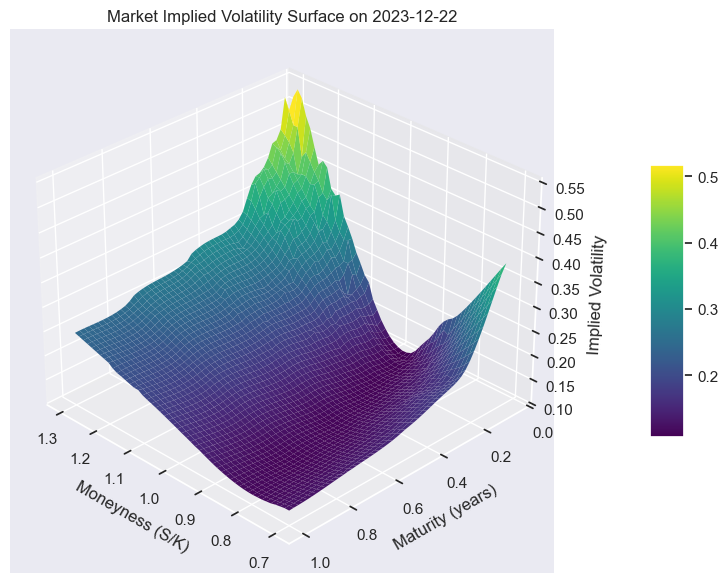

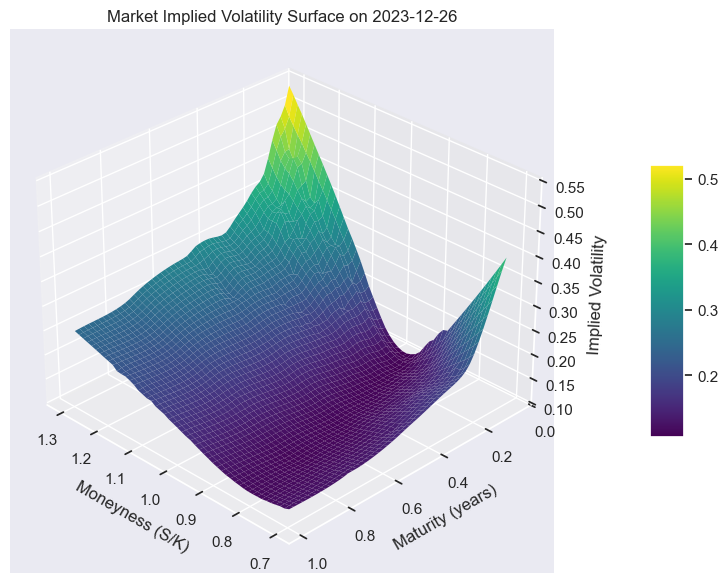

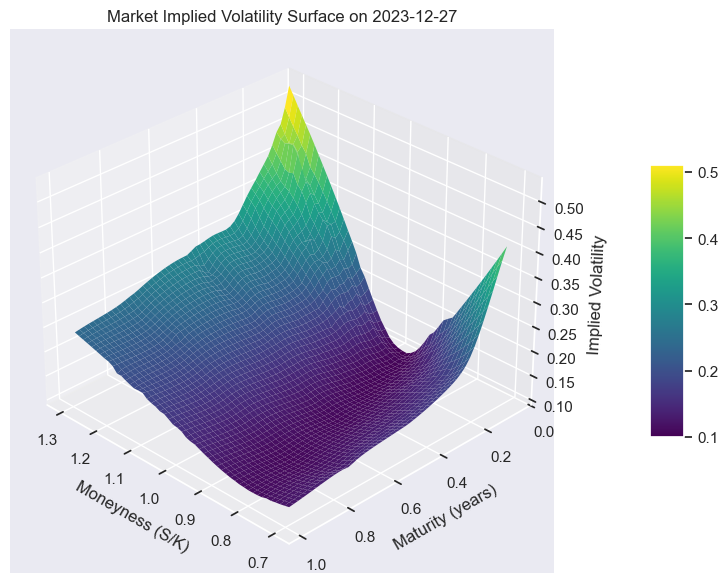

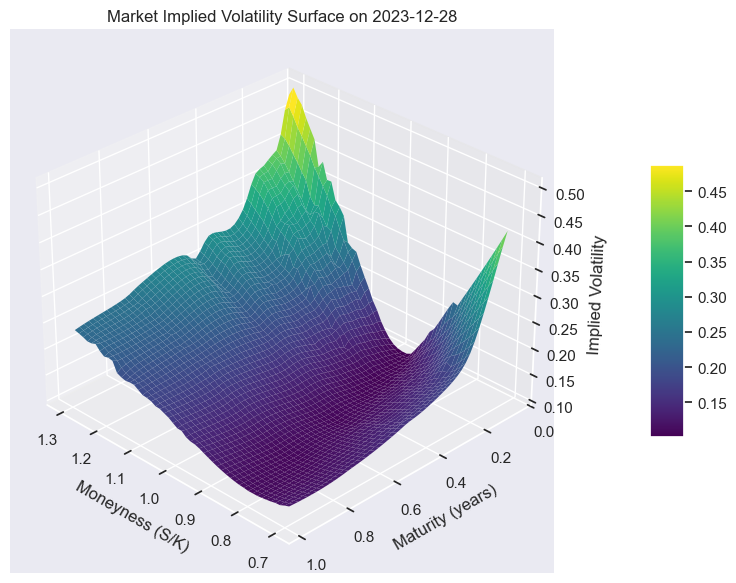

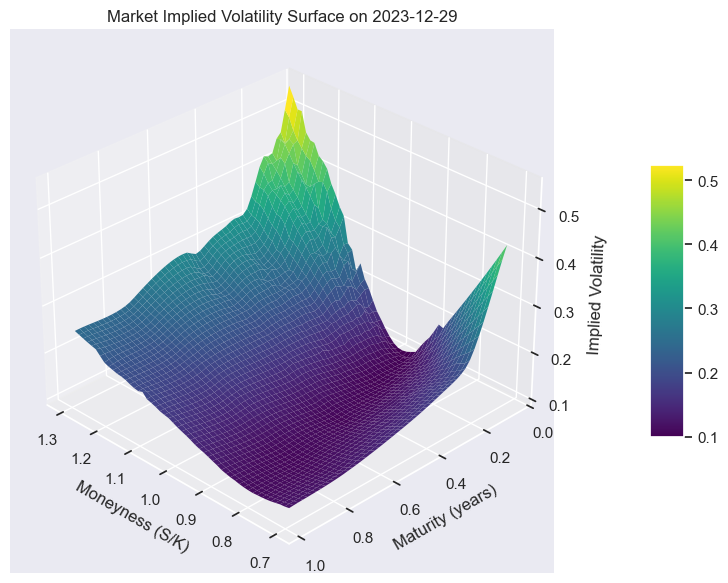

In [46]:
from joblib import Parallel, delayed

results = Parallel(n_jobs=-1)(
    delayed(make_iv_surface_RBF)(day, bracket=(0.10, 0.60)) for day in days
)

for i in range(len(results)):
    M, T, iv = results[i]
    day = days[i]
    draw_iv_surface(M, T, iv, day)